### Version 04/08 Jee: script for keypoint tracking pipeline, need some manual intervention

In [2]:
# ============================================================
# CELL 1 — CONFIG  (only cell you need to edit)
# ============================================================

from pathlib import Path

VIDEO_PATH    = Path('../../RL_project/BrandnewLiebherr945.mp4')  # <-- change this
OUTPUT_DIR    = VIDEO_PATH.parent / (VIDEO_PATH.stem + '_output')            # auto-derived
FPS           = 10
SEQ_LENGTH    = 400   # frames per sequence (includes 1 overlap frame)
NUM_KEYPOINTS = 10    # 8 arm/body keypoints + 2 cabin rotation reference points

print(f'Video     : {VIDEO_PATH}')
print(f'Output dir: {OUTPUT_DIR}')
print(f'FPS       : {FPS}')
print(f'Seq length: {SEQ_LENGTH} frames')
print(f'Keypoints : {NUM_KEYPOINTS}')


Video     : ../../RL_project/BrandnewLiebherr945.mp4
Output dir: ../../RL_project/BrandnewLiebherr945_output
FPS       : 10
Seq length: 400 frames
Keypoints : 10


In [3]:
# ============================================================
# CELL 2 — EXTRACT FRAMES with ffmpeg
# ============================================================

import subprocess, os, glob

frames_dir = os.path.join(OUTPUT_DIR, 'frames')
os.makedirs(frames_dir, exist_ok=True)

subprocess.run([
    'ffmpeg', '-i', VIDEO_PATH,
    '-vf', f'fps={FPS}',
    '-q:v', '2',
    os.path.join(frames_dir, 'frame_%06d.jpg')
], check=True)

frame_paths = sorted(glob.glob(os.path.join(frames_dir, '*.jpg')))
print(f'Extracted {len(frame_paths)} frames at {FPS} fps')
print(f'Total duration: {len(frame_paths)/FPS:.1f} seconds')

ffmpeg version 8.0.1 Copyright (c) 2000-2025 the FFmpeg developers
  built with gcc 14.3.0 (conda-forge gcc 14.3.0-18)
  configuration: --prefix=/home/caee/anaconda3/envs/excavator --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1773007661644/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1773007661644/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=x86_64-conda-linux-gnu-nm --ar=x86_64-conda-linux-gnu-ar --disable-doc --enable-openssl --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libharfbuzz --enable-libfontconfig --enable-libopenh264 --enable-libdav1d --disable-gnutls --enable-libvpx --enable-libass --enable-pthreads --enable-alsa --enable-libpulse --enable-libvpl --enable-vaapi --enable-libopenvino --enable-gpl --enable-libx264 --enable-libx265 --enable-libmp3lame --enable-libaom --enable-libsvtav1 --enable-libxml2 --enable-pic --enable-shared --disable-static --enable-version3 --enable-zlib --en

Extracted 7700 frames at 10 fps
Total duration: 770.0 seconds


[out#0/image2 @ 0x5a5b6e0912c0] video:547945KiB audio:0KiB subtitle:0KiB other streams:0KiB global headers:0KiB muxing overhead: unknown
frame= 7700 fps=2762 q=2.0 Lsize=N/A time=00:12:50.00 bitrate=N/A speed= 276x elapsed=0:00:02.78    


In [4]:
# ============================================================
# CELL 3 — SPLIT frames into sequences (reads directly from folder)
#   Works even if Cell 2 wasn't run, or if frames were deleted.
#   Frames are sorted by filename — gaps in numbering are fine.
# ============================================================

import json, os, glob

# CONFIG from Cell 1

frames_dir  = os.path.join(OUTPUT_DIR, 'frames')
frame_paths = sorted(glob.glob(os.path.join(frames_dir, '*.jpg')))

print(f'Found {len(frame_paths)} frames in {frames_dir}')
print(f'First: {os.path.basename(frame_paths[0])}')
print(f'Last:  {os.path.basename(frame_paths[-1])}')

sequences_dir = os.path.join(OUTPUT_DIR, 'sequences')
os.makedirs(sequences_dir, exist_ok=True)

step = SEQ_LENGTH - 1
num_sequences = max(1, (len(frame_paths) - 1 + step - 1) // step)

sequence_manifest = []
for seq_idx in range(num_sequences):
    start      = seq_idx * step
    end        = start + SEQ_LENGTH
    seq_frames = frame_paths[start : min(end, len(frame_paths))]

    seq_dir = os.path.join(sequences_dir, f'seq_{seq_idx:04d}')
    os.makedirs(seq_dir, exist_ok=True)

    with open(os.path.join(seq_dir, 'frame_list.txt'), 'w') as f:
        f.write('\n'.join(seq_frames))

    sequence_manifest.append({
        'seq_idx':     seq_idx,
        'dir':         seq_dir,
        'num_frames':  len(seq_frames),
        'first_frame': os.path.basename(seq_frames[0]),
        'last_frame':  os.path.basename(seq_frames[-1]),
    })

with open(os.path.join(OUTPUT_DIR, 'sequence_manifest.json'), 'w') as f:
    json.dump(sequence_manifest, f, indent=2)

print(f'\nCreated {num_sequences} sequences of up to {SEQ_LENGTH} frames (1-frame overlap)')
for s in sequence_manifest[:5]:
    print(f"  seq_{s['seq_idx']:04d}: {s['first_frame']} \u2192 {s['last_frame']} ({s['num_frames']} frames)")
if len(sequence_manifest) > 5:
    print(f'  ... ({len(sequence_manifest)-5} more)')

Found 647 frames in ../../RL_project/BrandnewLiebherr945_output/frames
First: frame_000001.jpg
Last:  frame_000647.jpg

Created 2 sequences of up to 400 frames (1-frame overlap)
  seq_0000: frame_000001.jpg → frame_000400.jpg (400 frames)
  seq_0001: frame_000400.jpg → frame_000647.jpg (248 frames)


Found 647 frames in ../../RL_project/BrandnewLiebherr945_output/frames
First: frame_000001.jpg
Last:  frame_000647.jpg


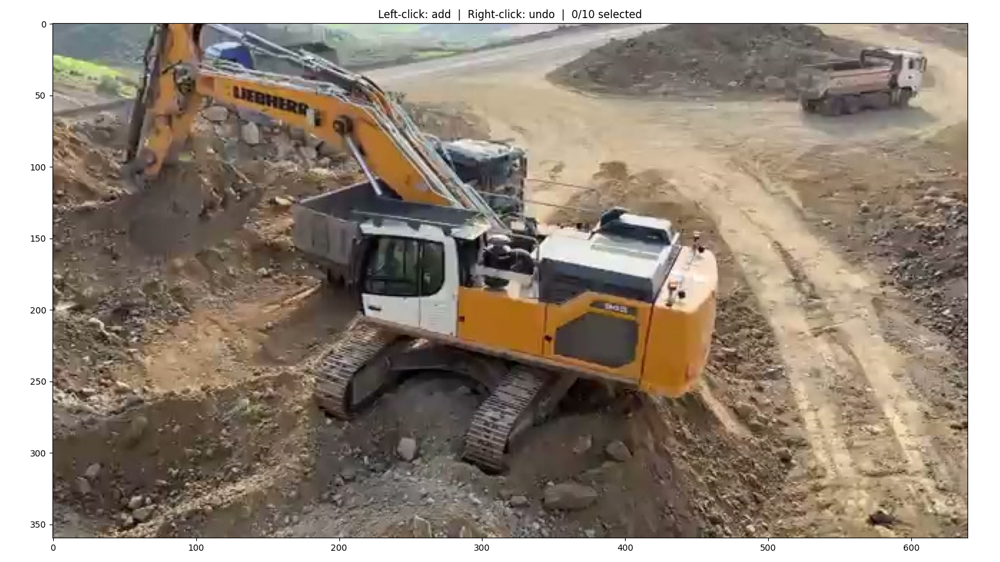

In [5]:
# ============================================================
# CELL 4 — INTERACTIVE KEYPOINT PICKER on first frame
#   Left-click  → add point
#   Right-click → undo last point
# ============================================================

import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import json, os, glob

# CONFIG from Cell 1

frames_dir  = os.path.join(OUTPUT_DIR, 'frames')
frame_paths = sorted(glob.glob(os.path.join(frames_dir, '*.jpg')))

print(f'Found {len(frame_paths)} frames in {frames_dir}')
print(f'First: {os.path.basename(frame_paths[0])}')
print(f'Last:  {os.path.basename(frame_paths[-1])}')


%matplotlib widget
# If widget doesn't work: use %matplotlib notebook  (classic Jupyter)

first_frame    = np.array(Image.open(frame_paths[0]))
clicked_points = []

fig, ax = plt.subplots(figsize=(16, 9))
ax.imshow(first_frame)
ax.set_title(f'Left-click: add  |  Right-click: undo  |  0/{NUM_KEYPOINTS} selected', fontsize=12)

def redraw():
    ax.cla()
    ax.imshow(first_frame)
    done   = len(clicked_points) == NUM_KEYPOINTS
    color  = 'lime' if done else 'red'
    status = 'DONE — close window or run next cell' if done else f'{len(clicked_points)}/{NUM_KEYPOINTS} selected'
    ax.set_title(f'Left-click: add  |  Right-click: undo  |  {status}', fontsize=12)
    for i, (px, py) in enumerate(clicked_points):
        ax.plot(px, py, '+', color=color, markersize=16, markeredgewidth=2.5)
        ax.annotate(str(i+1), (px+10, py-10), color=color, fontsize=11, fontweight='bold',
                    bbox=dict(boxstyle='round,pad=0.2', fc='black', alpha=0.5))
    fig.canvas.draw()

def onclick(event):
    if event.xdata is None or event.ydata is None:
        return
    if event.button == 1 and len(clicked_points) < NUM_KEYPOINTS:
        clicked_points.append([int(event.xdata), int(event.ydata)])
    elif event.button == 3 and clicked_points:
        clicked_points.pop()
    redraw()

fig.canvas.mpl_connect('button_press_event', onclick)
plt.tight_layout()
plt.show()

In [6]:
# ============================================================
# CELL 5 — VERIFY selection
# ============================================================

import torch

assert len(clicked_points) == NUM_KEYPOINTS, \
    f'Need exactly {NUM_KEYPOINTS} points, got {len(clicked_points)}. Re-run Cell 4.'

print(f'Selected {NUM_KEYPOINTS} keypoints:')
for i, (x, y) in enumerate(clicked_points):
    print(f'  Point {i+1}: x={x}, y={y}')

queries_preview = torch.tensor([[[0, x, y] for x, y in clicked_points]], dtype=torch.float)
print(f'\nQuery tensor shape: {queries_preview.shape}')
print(queries_preview)

Selected 10 keypoints:
  Point 1: x=83, y=136
  Point 2: x=60, y=130
  Point 3: x=65, y=146
  Point 4: x=98, y=48
  Point 5: x=247, y=111
  Point 6: x=323, y=230
  Point 7: x=225, y=209
  Point 8: x=423, y=257
  Point 9: x=425, y=243
  Point 10: x=227, y=195

Query tensor shape: torch.Size([1, 10, 3])
tensor([[[  0.,  83., 136.],
         [  0.,  60., 130.],
         [  0.,  65., 146.],
         [  0.,  98.,  48.],
         [  0., 247., 111.],
         [  0., 323., 230.],
         [  0., 225., 209.],
         [  0., 423., 257.],
         [  0., 425., 243.],
         [  0., 227., 195.]]])


In [7]:
# ============================================================
# CELL 6 — CLEAR MEMORY before tracking
# ============================================================

import gc
import torch

plt.close('all')
del first_frame
gc.collect()
torch.cuda.empty_cache()

print('Memory cleared — ready for tracking')

Memory cleared — ready for tracking


In [8]:
# ============================================================
# CELL 7 — RUN COTRACKER (online) on all sequences
#   Last-frame positions are propagated as queries for next sequence
# ============================================================

import torch
import numpy as np
from PIL import Image
import json, gc, os

device    = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f'Using device: {device}')
cotracker = torch.hub.load('facebookresearch/co-tracker', 'cotracker3_online').to(device)

current_points = [list(p) for p in clicked_points]  # [[x, y], ...]

for seq_info in sequence_manifest:
    seq_idx = seq_info['seq_idx']
    seq_dir = seq_info['dir']
    print(f"[{seq_idx+1}/{len(sequence_manifest)}] {os.path.basename(seq_dir)}  "
          f"frames {seq_info['first_frame']}–{seq_info['last_frame']}")

    with open(os.path.join(seq_dir, 'frame_list.txt')) as f:
        seq_frame_paths = [line.strip() for line in f if line.strip()]

    frames = np.stack([np.array(Image.open(p)) for p in seq_frame_paths])  # (T,H,W,3)
    video  = torch.tensor(frames).permute(0, 3, 1, 2)[None].float().to(device)  # (1,T,C,H,W)
    del frames
    gc.collect()

    queries = torch.tensor(
        [[[0, x, y] for x, y in current_points]], dtype=torch.float
    ).to(device)  # (1, N, 3)

    with open(os.path.join(seq_dir, 'queries.json'), 'w') as f:
        json.dump(current_points, f)

    # Initialize online processing
    cotracker(video_chunk=video, is_first_step=True, queries=queries)

    # Process chunks — final pred_tracks contains all frames
    pred_tracks, pred_visibility = None, None
    for ind in range(0, video.shape[1] - cotracker.step, cotracker.step):
        pred_tracks, pred_visibility = cotracker(
            video_chunk=video[:, ind : ind + cotracker.step * 2]
        )
    # pred_tracks:     (1, T, N, 2)
    # pred_visibility: (1, T, N, 1)

    del video
    torch.cuda.empty_cache()

    np.save(os.path.join(seq_dir, 'pred_tracks.npy'),     pred_tracks.cpu().numpy())
    np.save(os.path.join(seq_dir, 'pred_visibility.npy'), pred_visibility.cpu().numpy())

    # Propagate last-frame positions → queries for next sequence
    last_positions = pred_tracks[0, -1, :, :]  # (N, 2)
    current_points = [[int(pt[0].item()), int(pt[1].item())] for pt in last_positions]
    print(f'  -> Next queries: {current_points}')

    del pred_tracks, pred_visibility, queries
    torch.cuda.empty_cache()

print('\nAll sequences processed!')

Using device: cuda


Using cache found in /home/caee/.cache/torch/hub/facebookresearch_co-tracker_main


[1/2] seq_0000  frames frame_000001.jpg–frame_000400.jpg
  -> Next queries: [[245, 97], [192, 101], [225, 98], [93, 88], [304, 134], [424, 229], [327, 237], [511, 226], [517, 198], [319, 222]]
[2/2] seq_0001  frames frame_000400.jpg–frame_000647.jpg
  -> Next queries: [[321, 49], [274, 33], [304, 43], [174, -11], [358, 116], [453, 222], [362, 233], [539, 215], [544, 184], [354, 219]]

All sequences processed!


Loaded start points from saved queries: [[83, 136], [60, 130], [65, 146], [98, 48], [247, 111], [323, 230], [225, 209], [423, 257], [425, 243], [227, 195]]
Using device: cuda


Using cache found in /home/caee/.cache/torch/hub/facebookresearch_co-tracker_main



[1/2] seq_0000  (400 frames)
  Pick MID points (frame 200/399)...


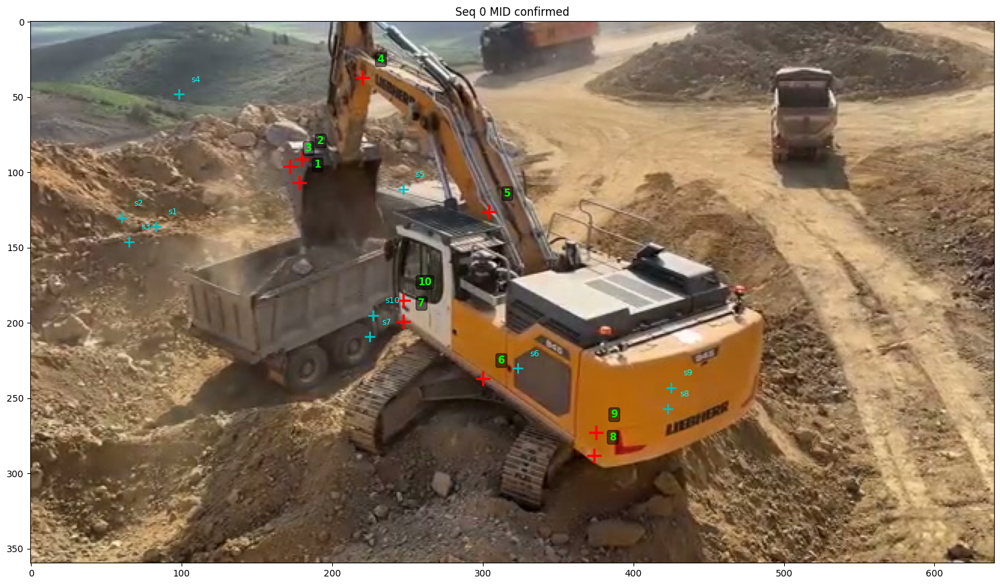

  Pick END points (frame 399/399)...


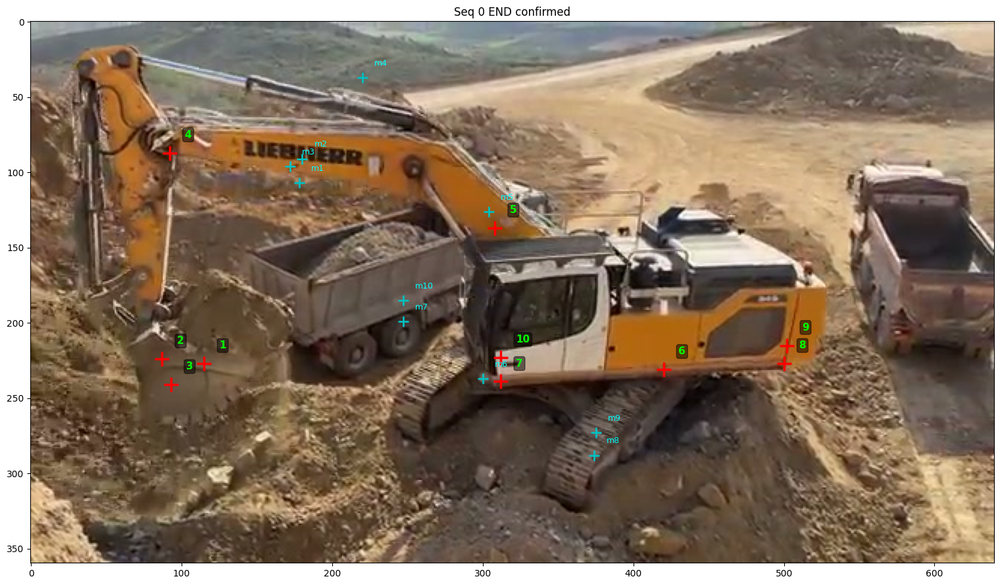

  -> Next start queries: [[115, 227], [87, 224], [93, 241], [92, 87], [308, 137], [420, 231], [312, 239], [500, 227], [502, 215], [312, 223]]

[2/2] seq_0001  (248 frames)
  Pick MID points (frame 124/247)...


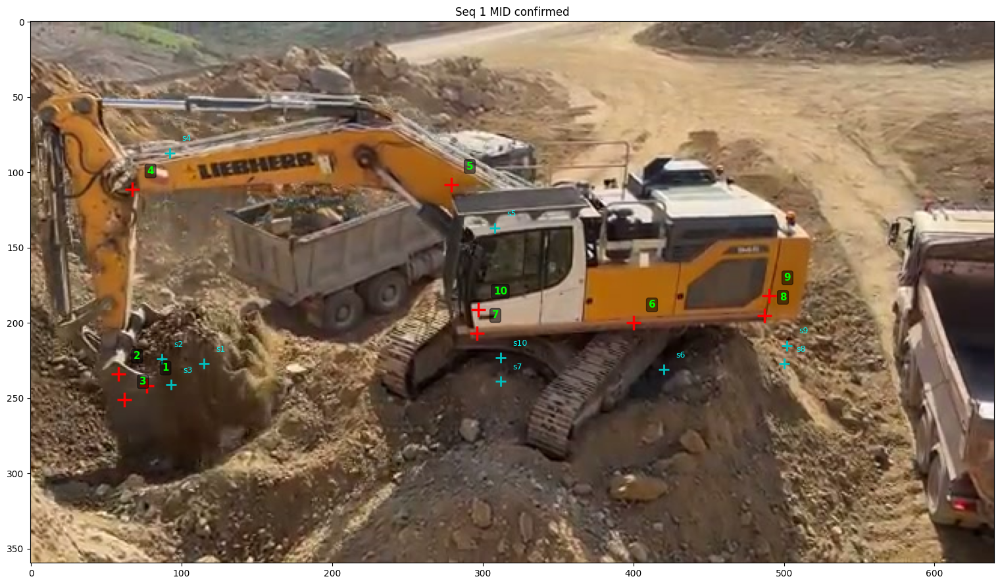

  Pick END points (frame 247/247)...


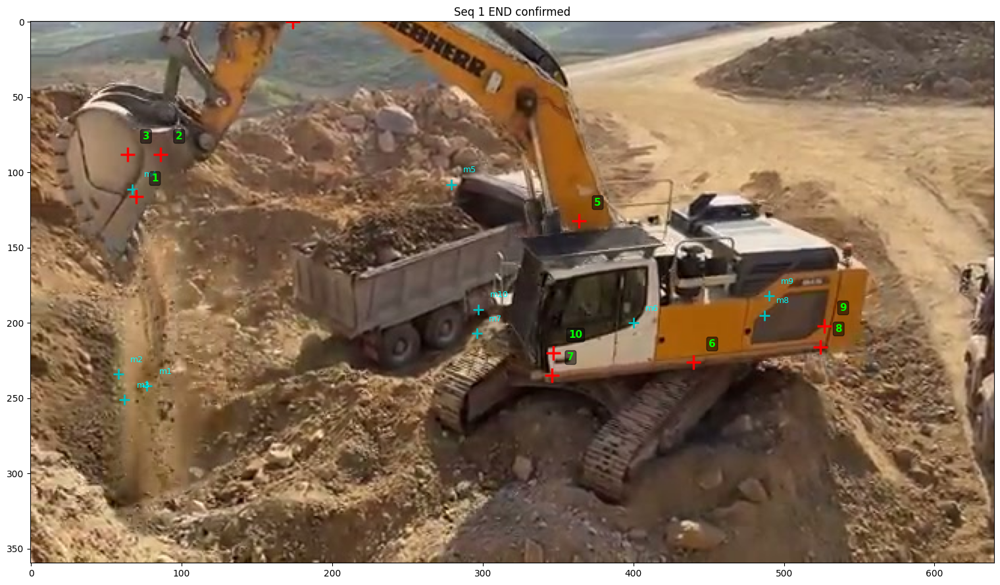

  -> Next start queries: [[70, 116], [86, 88], [64, 88], [174, 0], [364, 132], [440, 226], [346, 235], [524, 216], [527, 202], [347, 220]]

All sequences processed with start+mid+end anchors!


In [9]:
# ============================================================
# CELL 7b — RUN COTRACKER (online) with START + MID + END anchors
#   Standalone — loads everything from disk, no prior cells needed
#   Set the paths/config below, then run
# ============================================================

import matplotlib
matplotlib.use('TkAgg')
import matplotlib.pyplot as plt
import torch
import numpy as np
from PIL import Image
import json, gc, os

# CONFIG from Cell 1
RESUME_FROM_SEQ = 0  # <-- set > 0 to resume from a specific sequence if interrupted

# --- Load manifest ---
with open(os.path.join(OUTPUT_DIR, 'sequence_manifest.json')) as f:
    sequence_manifest = json.load(f)

# --- Load start points ---
if RESUME_FROM_SEQ == 0:
    first_queries_path = os.path.join(sequence_manifest[0]['dir'], 'queries.json')
    if os.path.exists(first_queries_path):
        with open(first_queries_path) as f:
            saved = json.load(f)
        current_start_points = saved['start'] if isinstance(saved, dict) else saved
        print(f'Loaded start points from saved queries: {current_start_points}')
    else:
        raise RuntimeError('No saved queries found. Run Cells 4+5 first to pick initial keypoints.')
else:
    prev_seq_dir = sequence_manifest[RESUME_FROM_SEQ - 1]['dir']
    with open(os.path.join(prev_seq_dir, 'queries.json')) as f:
        saved = json.load(f)
    current_start_points = saved['end'] if isinstance(saved, dict) else saved
    print(f'Resuming from seq {RESUME_FROM_SEQ}, start points: {current_start_points}')

device    = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f'Using device: {device}')
cotracker = torch.hub.load('facebookresearch/co-tracker', 'cotracker3_online').to(device)


def pick_points(frame, title, ref_points=None, ref_label='ref'):
    """Open a TkAgg window, show frame with optional reference markers, return clicked points."""
    matplotlib.use('TkAgg')
    fig, ax = plt.subplots(figsize=(16, 9))
    ax.imshow(frame)
    if ref_points:
        for i, (sx, sy) in enumerate(ref_points):
            ax.plot(sx, sy, 'c+', markersize=12, markeredgewidth=2)
            ax.annotate(f'{ref_label}{i+1}', (sx+8, sy-8), color='cyan', fontsize=9)
    ax.set_title(title, fontsize=11)
    plt.tight_layout()
    raw = plt.ginput(NUM_KEYPOINTS, timeout=0, mouse_add=1, mouse_pop=3, mouse_stop=2)
    plt.close(fig)
    return [[int(x), int(y)] for x, y in raw]


def show_confirmation(frame, points, title, ref_points=None, ref_label='ref'):
    """Show inline confirmation plot after picking."""
    get_ipython().run_line_magic('matplotlib', 'inline')
    fig, ax = plt.subplots(figsize=(16, 9))
    ax.imshow(frame)
    if ref_points:
        for i, (sx, sy) in enumerate(ref_points):
            ax.plot(sx, sy, 'c+', markersize=12, markeredgewidth=2)
            ax.annotate(f'{ref_label}{i+1}', (sx+8, sy-8), color='cyan', fontsize=9)
    for i, (px, py) in enumerate(points):
        ax.plot(px, py, 'r+', markersize=16, markeredgewidth=2.5)
        ax.annotate(str(i+1), (px+10, py-10), color='lime', fontsize=11, fontweight='bold',
                    bbox=dict(boxstyle='round,pad=0.2', fc='black', alpha=0.5))
    ax.set_title(title, fontsize=12)
    plt.tight_layout()
    plt.show()


for seq_info in sequence_manifest[RESUME_FROM_SEQ:]:
    seq_idx = seq_info['seq_idx']
    seq_dir = seq_info['dir']
    T       = seq_info['num_frames']
    mid_idx = T // 2

    print(f"\n[{seq_idx+1}/{len(sequence_manifest)}] {os.path.basename(seq_dir)}  "
          f"({T} frames)")

    with open(os.path.join(seq_dir, 'frame_list.txt')) as f:
        seq_frame_paths = [line.strip() for line in f if line.strip()]

    mid_frame  = np.array(Image.open(seq_frame_paths[mid_idx]))
    last_frame = np.array(Image.open(seq_frame_paths[-1]))

    # --- Pick mid points ---
    print(f'  Pick MID points (frame {mid_idx}/{T-1})...')
    mid_points = pick_points(
        mid_frame,
        f'Seq {seq_idx} MID FRAME ({mid_idx}) — click {NUM_KEYPOINTS} points in order  '
        f'|  Right-click: undo  |  Cyan = start positions',
        ref_points=current_start_points, ref_label='s'
    )
    assert len(mid_points) == NUM_KEYPOINTS, f'Expected {NUM_KEYPOINTS}, got {len(mid_points)}'
    show_confirmation(mid_frame, mid_points, f'Seq {seq_idx} MID confirmed', current_start_points, 's')

    # --- Pick end points ---
    print(f'  Pick END points (frame {T-1}/{T-1})...')
    end_points = pick_points(
        last_frame,
        f'Seq {seq_idx} LAST FRAME — click {NUM_KEYPOINTS} end points in order  '
        f'|  Right-click: undo  |  Cyan = mid positions',
        ref_points=mid_points, ref_label='m'
    )
    assert len(end_points) == NUM_KEYPOINTS, f'Expected {NUM_KEYPOINTS}, got {len(end_points)}'
    show_confirmation(last_frame, end_points, f'Seq {seq_idx} END confirmed', mid_points, 'm')

    # --- Build combined queries: start + mid + end ---
    start_queries = [[0,        x, y] for x, y in current_start_points]
    mid_queries   = [[mid_idx,  x, y] for x, y in mid_points]
    end_queries   = [[T-1,      x, y] for x, y in end_points]
    queries = torch.tensor([start_queries + mid_queries + end_queries], dtype=torch.float).to(device)

    with open(os.path.join(seq_dir, 'queries.json'), 'w') as f:
        json.dump({'start': current_start_points, 'mid': mid_points, 'mid_idx': mid_idx, 'end': end_points}, f)

    # --- Load frames and track ---
    frames = np.stack([np.array(Image.open(p)) for p in seq_frame_paths])
    video  = torch.tensor(frames).permute(0, 3, 1, 2)[None].float().to(device)
    del frames, mid_frame, last_frame
    gc.collect()

    cotracker(video_chunk=video, is_first_step=True, queries=queries)

    pred_tracks, pred_visibility = None, None
    for ind in range(0, video.shape[1] - cotracker.step, cotracker.step):
        pred_tracks, pred_visibility = cotracker(
            video_chunk=video[:, ind : ind + cotracker.step * 2]
        )

    del video
    torch.cuda.empty_cache()

    # --- Adjust points 1 and 3: extend distance from point 2 by 2x ---
    # new_p1 = p2 + 2*(p1 - p2),  new_p3 = p2 + 2*(p3 - p2)
    tracks_out = pred_tracks[:, :, :NUM_KEYPOINTS].clone()
    p1 = tracks_out[:, :, 0, :].clone()
    p2 = tracks_out[:, :, 1, :].clone()
    p3 = tracks_out[:, :, 2, :].clone()
    tracks_out[:, :, 0, :] = p2 + 2 * (p1 - p2)
    tracks_out[:, :, 2, :] = p2 + 2 * (p3 - p2)

    # Save only the first N tracks (start-anchored, discard mid/end anchor duplicates)
    np.save(os.path.join(seq_dir, 'pred_tracks_anchored.npy'), tracks_out.cpu().numpy())
    np.save(os.path.join(seq_dir, 'pred_visibility_anchored.npy'), pred_visibility[:, :, :NUM_KEYPOINTS].cpu().numpy())

    current_start_points = end_points
    print(f'  -> Next start queries: {current_start_points}')

    del pred_tracks, pred_visibility, queries
    torch.cuda.empty_cache()

print('\nAll sequences processed with start+mid+end anchors!')

In [10]:
# ============================================================
# CELL 8 — VISUALIZE all sequences
# ============================================================

from cotracker.utils.visualizer import Visualizer
import torch, numpy as np, os, glob
from PIL import Image

# CONFIG from Cell 1
device     = 'cuda' if torch.cuda.is_available() else 'cpu'

# Auto-discover all available sequences
seq_dirs = sorted(glob.glob(os.path.join(OUTPUT_DIR, 'sequences', 'seq_*')))
print(f'Found {len(seq_dirs)} sequences in {OUTPUT_DIR}/sequences/')
for d in seq_dirs:
    print(f'  {os.path.basename(d)}')

vis_out_dir = os.path.join(OUTPUT_DIR, 'visualizations')
os.makedirs(vis_out_dir, exist_ok=True)

vis = Visualizer(save_dir=vis_out_dir, pad_value=120, linewidth=3)

for seq_dir in seq_dirs:
    seq_name = os.path.basename(seq_dir)

    tracks_path = os.path.join(seq_dir, 'pred_tracks_anchored.npy')
    vis_path    = os.path.join(seq_dir, 'pred_visibility_anchored.npy')
    if not os.path.exists(tracks_path):
        print(f'  [{seq_name}] no tracks found — skipping')
        continue

    with open(os.path.join(seq_dir, 'frame_list.txt')) as f:
        seq_frame_paths = [line.strip() for line in f if line.strip()]

    frames_vis = np.stack([np.array(Image.open(p)) for p in seq_frame_paths])
    video_vis  = torch.tensor(frames_vis).permute(0, 3, 1, 2)[None].float().to(device)
    del frames_vis

    tracks_vis = torch.tensor(np.load(tracks_path)).to(device)
    vis_mask   = torch.tensor(np.load(vis_path)).to(device)

    out_name = f'{seq_name}_anchored'
    vis.visualize(video_vis, tracks_vis, vis_mask, filename=out_name)
    print(f'  [{seq_name}] saved → {vis_out_dir}/{out_name}.mp4')

    del video_vis, tracks_vis, vis_mask
    torch.cuda.empty_cache()

print(f'\nDone. {len(seq_dirs)} sequences visualized.')


Found 2 sequences in ../../RL_project/BrandnewLiebherr945_output/sequences/
  seq_0000
  seq_0001


IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (880, 600) to (880, 608) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


Video saved to ../../RL_project/BrandnewLiebherr945_output/visualizations/seq_0000_anchored.mp4
  [seq_0000] saved → ../../RL_project/BrandnewLiebherr945_output/visualizations/seq_0000_anchored.mp4


IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (880, 600) to (880, 608) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


Video saved to ../../RL_project/BrandnewLiebherr945_output/visualizations/seq_0001_anchored.mp4
  [seq_0001] saved → ../../RL_project/BrandnewLiebherr945_output/visualizations/seq_0001_anchored.mp4

Done. 2 sequences visualized.
